# Using Stable Diffusion and SAM to Modify Image Contents Zero Shot

# Text-Based Image Editing with Three Models

Here, we leverage the strengths of three models (SAM, Stable Diffusion, and Grounding DINO) to edit and manipulate images.

Our process starts by installing the necessary libraries and models.

We begin with SAM, a powerful segmentation model, Stable Diffusion for image inpainting, and GroundingDINO for image captioning to implement complex image transformations.

#### Segment Anything Model (SAM)

[GitHub](https://github.com/facebookresearch/segment-anything)

#### Grounding DINO

[GitHub](https://github.com/IDEA-Research/GroundingDINO)

#### Stable Diffusion

[GitHub](https://github.com/CompVis/stable-diffusion)
[Hugging-Face](https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/inpaint)

## Install the required libraries.

In [1]:
# ----install SAM, Stable Diffusion and libraries
!pip -q install diffusers transformers scipy segment_anything

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 8.7 MB/s eta 0:00:00


In [2]:
# ------install GroundingDINO, DINO weights
# 1.Clone the GroundingDINO repository from GitHub.
!git clone https://github.com/IDEA-Research/GroundingDINO.git

# 2.Change the current directory to the GroundingDINO folder.
%cd GroundingDINO

# 3.Install the required dependencies in the current directory.
!pip -q install -e .

# 4. Download pre-trained model weights.
%mkdir weights
%cd weights
# Also add sam weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
%cd ..

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (190/190), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 421 (delta 145), reused 128 (delta 128), pack-reused 231
Receiving objects: 100% (421/421), 12.85 MiB | 31.49 MiB/s, done.
Resolving deltas: 100% (216/216), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.8 MB/s eta 0:00:00
/content/GroundingDINO/weights
/content/GroundingDINO


## Load the Libraries

In [13]:
# SAM
from segment_anything import SamPredictor, sam_model_registry

# Inpainting
from diffusers import StableDiffusionInpaintPipeline
from PIL import Image
import requests
import torch
from io import BytesIO

# Grounding Dino
from groundingdino.util.inference import load_model, load_image, predict, annotate
from GroundingDINO.groundingdino.util import box_ops

import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

## Set Parameters

In [8]:
!nvidia-smi

Sat Feb  3 13:29:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [15]:
# -----Set Image and CUDA
device = "cuda"

In [10]:
# ------SAM Parameters
model_type = "vit_h"
predictor = SamPredictor(sam_model_registry[model_type](checkpoint="./weights/sam_vit_h_4b8939.pth").to(device=device))

# ------Stable Diffusion
pipe = StableDiffusionInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-2-inpainting", torch_dtype=torch.float16,).to(device)

# ----Grounding DINO
groundingdino_model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")

model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

### Input

In [16]:
img_path = '/content/fire.jpeg'

src, img = load_image(img_path)

# ---- prompt is for identifying target object in the image
TEXT_PROMPT = "fire hydrant"

BOX_TRESHOLD = 0.3

TEXT_TRESHOLD = 0.25

# Dino Code

## Step 1: Get the bounding box

    """
    Makes predictions using GroundingDINO model.

    Parameters:
    - model: Pre-trained model for prediction.
    - image (torch.Tensor): Image tensor for prediction.
    - caption (str): Text prompt for prediction.
    - box_threshold (float): Threshold for bounding boxes.
    - text_threshold (float): Threshold for phrases.
    - remove_combined (bool, optional): Flag to remove combined phrases.

    Returns:
    - boxes (torch.Tensor): Predicted bounding boxes.
    - logits (torch.Tensor): Confidence for each phrase.
    - phrases (List[str]): Predicted phrases.
    """


In [24]:
boxes, logits, phrases = predict(
    model = groundingdino_model,
    image = img,
    caption = TEXT_PROMPT,
    box_threshold = BOX_TRESHOLD,
    text_threshold = TEXT_TRESHOLD
)

img_annnotated = annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]
# cv2.imwrite("annotated_image.jpg", img_annnotated)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


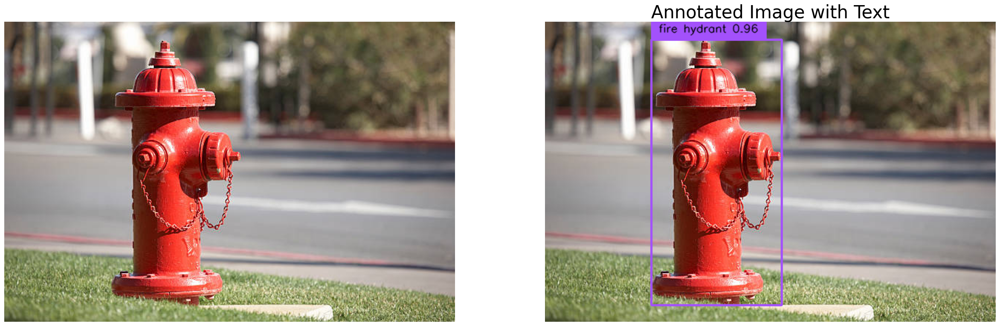

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Annotated Image with Text", fontsize=30)
axes[0].imshow(src)
axes[0].axis('off')
axes[1].imshow(img_annnotated)
axes[1].axis('off')

plt.show()

# SAM Code

## Step 2: Get the Mask from the bounding box.

    """
    Generates masks from prompts on the set image.

    Parameters:
    - point_coords (Optional[torch.Tensor]): Point prompts in pixels.
    - point_labels (Optional[torch.Tensor]): Labels for points (1: foreground, 0: background).
    - boxes (Optional[np.ndarray]): Box prompts in XYXY format.
    - mask_input (np.ndarray): Previous mask input.
    - multimask_output (bool): Returns multiple masks for ambiguous prompts.
    - return_logits (bool): Returns mask logits instead of binary masks.

    Returns:
    - masks (torch.Tensor): Output masks in BxCxHxW format.
    - qualities (torch.Tensor): Quality predictions for each mask.
    - logits (torch.Tensor): Low-res logits for next iteration.
    """


### Utill Functions

In [43]:
def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])

    h, w = mask.shape[-2:]

    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

In [27]:
predictor.set_image(src)

H, W, _ = src.shape

# Bounding box from grounding dino
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

new_boxes = predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

In [29]:
type(new_boxes)

torch.Tensor

In [31]:
masks, _, _ = predictor.predict_torch(
    point_coords = None,
    point_labels = None,
    boxes = new_boxes,
    multimask_output=False,
)

In [32]:
original_img = Image.fromarray(src).resize((512, 512))
img_annotated = Image.fromarray(img_annnotated)
only_mask = Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))
img_annotated_mask = Image.fromarray(show_mask(masks[0][0].cpu(), img_annnotated))

Bounding Box vs Segment

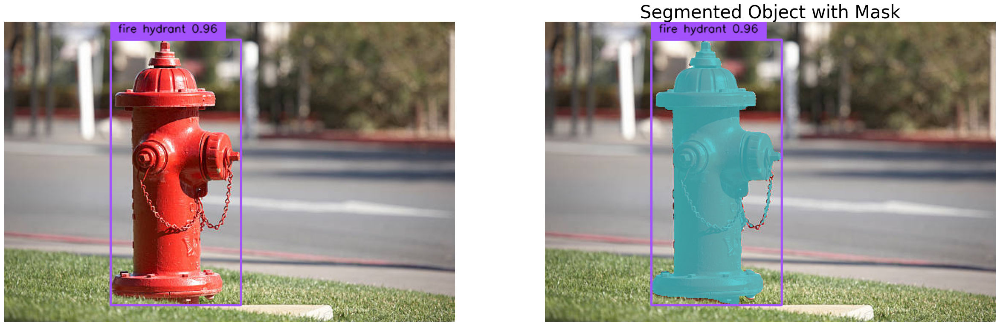

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Segmented Object with Mask", fontsize=30)
axes[0].imshow(img_annnotated)
axes[0].axis('off')
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
plt.show()

Segment vs Mask Only

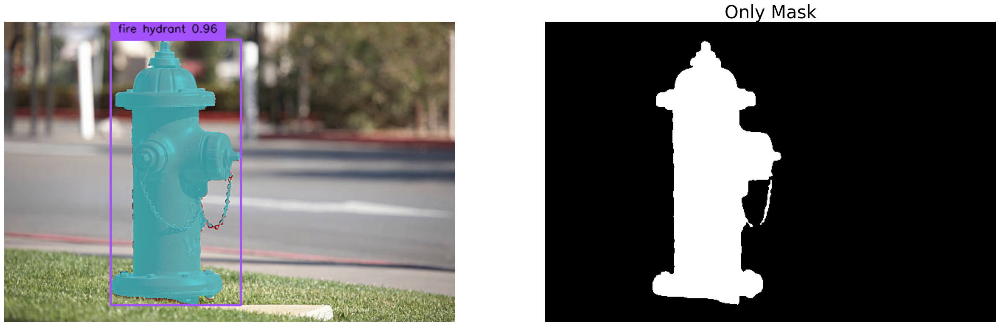

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Only Mask", fontsize=30)
axes[0].imshow(img_annotated_mask)
axes[0].axis('off')
axes[1].imshow(Image.fromarray(masks[0][0].cpu().numpy()))
axes[1].axis('off')

plt.show()

Original Image vs Segment

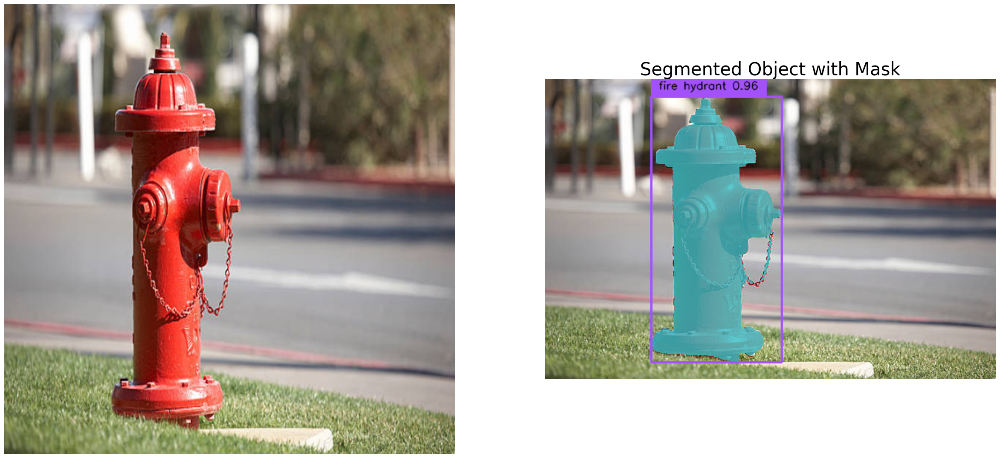

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Segmented Object with Mask", fontsize=30)
axes[0].imshow(original_img)
axes[0].axis('off')
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
plt.show()

# Stable Diffusion

## Step 3: Target Object to Replace with Text

In [40]:
prompt = "phone booth" #replace with this object

edited = pipe(prompt=prompt, image=original_img, mask_image=only_mask).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

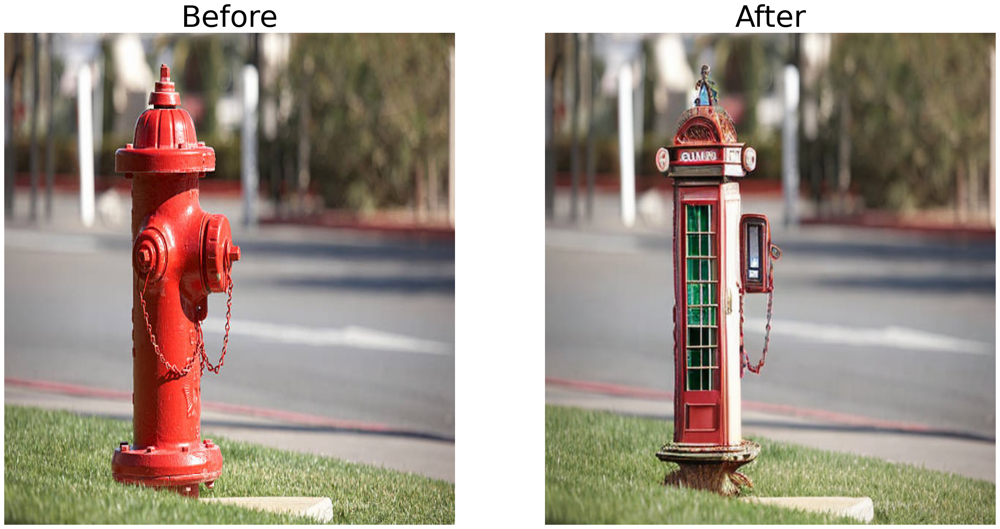

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(src)
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')
axes[1].imshow(edited)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()

# Combined Code

In [44]:
def process_boxes(boxes, src):
    H, W, _ = src.shape
    boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
    return predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

def edit_image(path, item, prompt, box_threshold, text_threshold):
    '''
    - path (str): Path to the image file
    - item (str): Item to be recognized in the image
    - prompt (str): Item to replace the selected object in the image
    - box_threshold (float): Threshold for the bounding box predictions.
    - text_threshold (float): Threshold for the text predictions.
    '''
    src, img = load_image(path)
    boxes, logits, phrases = predict(
        model=groundingdino_model,
        image=img,
        caption=item,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )
    predictor.set_image(src)
    new_boxes = process_boxes(boxes, src)
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=new_boxes,
        multimask_output=False,
    )
    img_annotated_mask = show_mask(masks[0][0].cpu(),
        annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]
    )
    return pipe(prompt=prompt,
        image=Image.fromarray(src).resize((512, 512)),
        mask_image=Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))
    ).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

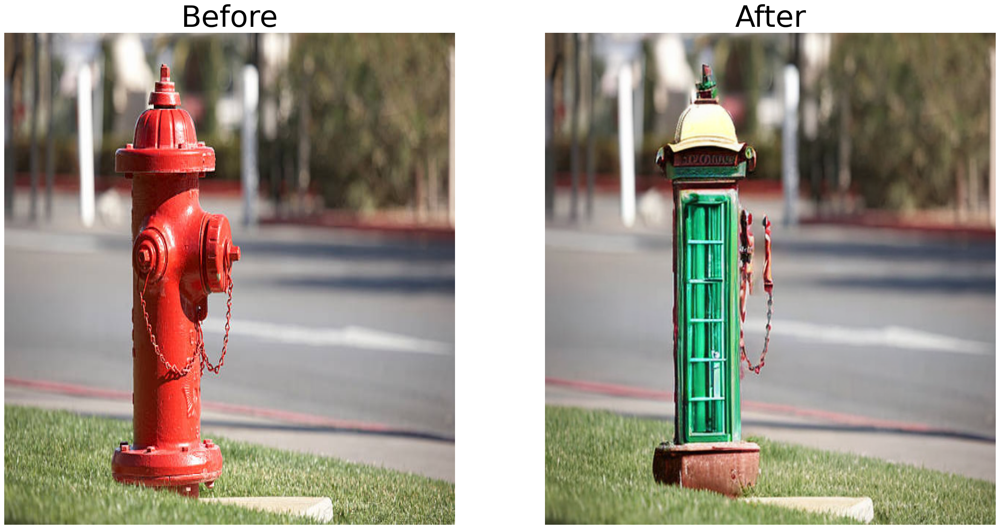

In [53]:
path = '/content/fire.jpeg'
edited_image = edit_image(path, "Fire Hydrant", "Phone Booth", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

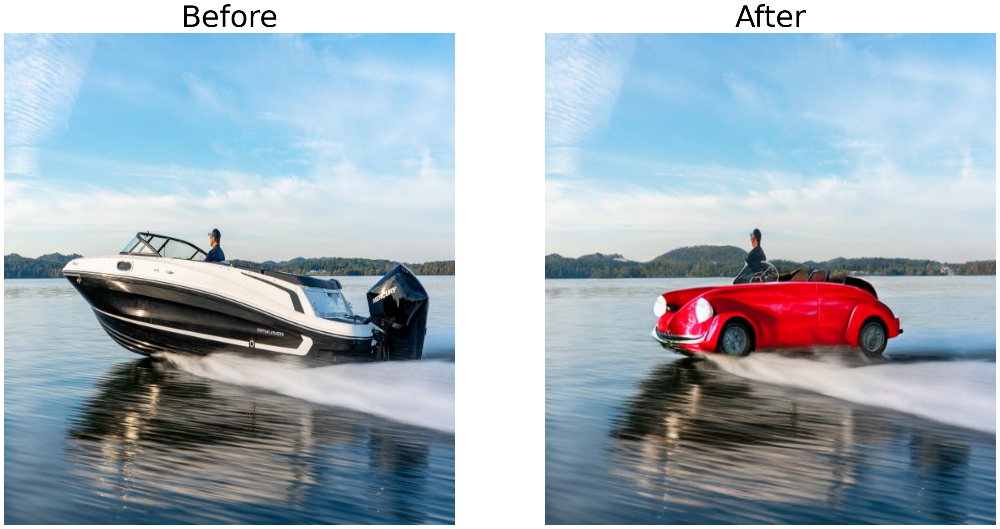

In [55]:
path = '/content/boat.jpg'
edited_image = edit_image(path, "boat", "a red car", 0.3, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_aspect('auto')
axes[0].set_title('Before', fontdict={'fontsize': 50})

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_aspect('auto')
axes[1].set_title('After', fontdict={'fontsize': 50})
plt.show()